In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import os
import glob
import random
import warnings
warnings.filterwarnings("ignore")

import numpy as np
from tqdm import tqdm
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

try:
    import timm
    has_timm = True
except:
    has_timm = False
    print("⚠️ TIMM not found. Using fallback CNN encoder.")

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)


Device: cuda


In [3]:
import os, glob

DATA_ROOT = "/kaggle/input/whu-building-dataset/WHU"

TRAIN_IMG = os.path.join(DATA_ROOT, "train", "Image")
TRAIN_MASK = os.path.join(DATA_ROOT, "train", "Mask")

VAL_IMG = os.path.join(DATA_ROOT, "val", "Image")
VAL_MASK = os.path.join(DATA_ROOT, "val", "Mask")

TEST_IMG = os.path.join(DATA_ROOT, "test", "Image")
TEST_MASK = os.path.join(DATA_ROOT, "test", "Mask")  # You have test masks

print("TRAIN_IMG =", TRAIN_IMG)
print("TRAIN_MASK =", TRAIN_MASK)
print("VAL_IMG =", VAL_IMG)
print("VAL_MASK =", VAL_MASK)
print("TEST_IMG =", TEST_IMG)
print("TEST_MASK =", TEST_MASK)

def load_images(folder):
    if folder is None:
        return []
    exts = ["*.png", "*.jpg", "*.jpeg", "*.tif", "*.tiff", "*.bmp"]
    paths = []
    for e in exts:
        paths += glob.glob(os.path.join(folder, e))
    return sorted(paths)

print("Train Images:", len(load_images(TRAIN_IMG)))
print("Train Masks :", len(load_images(TRAIN_MASK)))
print("Val Images  :", len(load_images(VAL_IMG)))
print("Val Masks   :", len(load_images(VAL_MASK)))
print("Test Images :", len(load_images(TEST_IMG)))
print("Test Masks  :", len(load_images(TEST_MASK)))


TRAIN_IMG = /kaggle/input/whu-building-dataset/WHU/train/Image
TRAIN_MASK = /kaggle/input/whu-building-dataset/WHU/train/Mask
VAL_IMG = /kaggle/input/whu-building-dataset/WHU/val/Image
VAL_MASK = /kaggle/input/whu-building-dataset/WHU/val/Mask
TEST_IMG = /kaggle/input/whu-building-dataset/WHU/test/Image
TEST_MASK = /kaggle/input/whu-building-dataset/WHU/test/Mask
Train Images: 5732
Train Masks : 5732
Val Images  : 1228
Val Masks   : 1228
Test Images : 1228
Test Masks  : 1228


In [4]:
class WHUDataset(Dataset):
    def __init__(self, image_paths, mask_paths=None, img_size=512):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.img_size = img_size

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert("RGB").resize((self.img_size, self.img_size))
        img = np.array(img) / 255.0
        img = torch.tensor(img).permute(2, 0, 1).float()

        if self.mask_paths:
            mask = Image.open(self.mask_paths[idx]).convert("L").resize((self.img_size, self.img_size))
            mask = np.array(mask) / 255.0
            mask = torch.tensor(mask).unsqueeze(0).float()
            return img, mask

        return img


In [5]:
import matplotlib.pyplot as plt

def show_prediction(model, dataset, idx=None):
    """
    Visualize model prediction:
    - Input Image
    - Ground Truth Mask
    - Predicted Mask
    - Overlay
    """
    model.eval()
    
    if idx is None:
        idx = np.random.randint(0, len(dataset))

    img, mask = dataset[idx]
    img_t = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred = torch.sigmoid(model(img_t))[0,0].cpu().numpy()

    img_np = img.permute(1,2,0).numpy()
    mask_np = mask[0].numpy()
    pred_np = (pred > 0.5).astype(np.float32)

    # Overlay
    overlay = img_np.copy()
    overlay[:,:,1] = np.maximum(overlay[:,:,1], pred_np)  # green overlay
    overlay[:,:,0] = overlay[:,:,0] * 0.7

    # Plot
    plt.figure(figsize=(14,4))
    plt.subplot(1,4,1)
    plt.title("Input")
    plt.imshow(img_np)
    plt.axis("off")

    plt.subplot(1,4,2)
    plt.title("Ground Truth")
    plt.imshow(mask_np, cmap="gray")
    plt.axis("off")

    plt.subplot(1,4,3)
    plt.title("Prediction")
    plt.imshow(pred_np, cmap="jet")
    plt.axis("off")

    plt.subplot(1,4,4)
    plt.title("Overlay")
    plt.imshow(overlay)
    plt.axis("off")

    plt.show()


In [6]:
class ViTEncoder(nn.Module):
    def __init__(self, model_name="vit_base_patch16_224", pretrained=True):
        super().__init__()

        # Create ViT backbone
        self.model = timm.create_model(model_name, pretrained=pretrained, num_classes=0)

        # Extract important attributes
        self.embed_dim = self.model.embed_dim   # <--- THIS FIXES YOUR ERROR
        self.patch = 16  # patch size for vit_base_patch16_224

    def forward(self, x):
        # Resize to ViT expected size
        x = F.interpolate(x, (224, 224), mode="bilinear", align_corners=False)

        # Token embeddings: [B, 197, C]
        tokens = self.model.forward_features(x)

        # If tokens are 3D (ViT behavior)
        if tokens.dim() == 3:
            tokens = tokens[:, 1:, :]    # remove class token -> [B, 196, C]
            B, N, C = tokens.shape
            H = W = int(N ** 0.5)        # 14×14 grid for 224x224 & patch=16
            tokens = tokens.reshape(B, H, W, C)   # [B, 14, 14, C]
            tokens = tokens.permute(0, 3, 1, 2)   # [B, C, 14, 14]
            return tokens

        # Some models return feature maps directly
        return tokens


In [7]:
class UNetDecoder(nn.Module):
    def __init__(self, in_ch, out_ch=1):
        super().__init__()
        self.up1 = nn.ConvTranspose2d(in_ch, 128, 2, stride=2)
        self.up2 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.up3 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.out = nn.Conv2d(32, out_ch, 1)

    def forward(self, x):
        x = F.relu(self.up1(x))
        x = F.relu(self.up2(x))
        x = F.relu(self.up3(x))
        x = self.out(x)
        x = F.interpolate(x, (512,512), mode="bilinear")
        return x


In [8]:
class UNetViT(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = ViTEncoder()
        enc_dim = self.encoder.embed_dim

        # Extra feature-channel from encoder mean map
        self.decoder = UNetDecoder(enc_dim + 1)

    def forward(self, x):
        f = self.encoder(x)
        fm = f.mean(1, keepdim=True)
        f_cat = torch.cat([f, fm], dim=1)
        out = self.decoder(f_cat)
        return out


In [9]:
class DiceLoss(nn.Module):
    def __init__(self):
        super().__init__()
    def forward(self, pred, mask, eps=1e-6):
        pred = torch.sigmoid(pred)
        num = 2 * (pred * mask).sum()
        den = pred.sum() + mask.sum() + eps
        return 1 - num/den

bce = nn.BCEWithLogitsLoss()
dice = DiceLoss()

def seg_loss(pred, mask):
    return 0.5 * bce(pred, mask) + 0.5 * dice(pred, mask)


In [10]:
class PretrainDecoder(nn.Module):
    def __init__(self, in_ch):
        super().__init__()
        self.up1 = nn.ConvTranspose2d(in_ch, 128, 2, 2)
        self.up2 = nn.ConvTranspose2d(128, 64, 2, 2)
        self.up3 = nn.ConvTranspose2d(64, 32, 2, 2)
        self.out = nn.Conv2d(32, 3, 1)

    def forward(self, x):
        x = F.relu(self.up1(x))
        x = F.relu(self.up2(x))
        x = F.relu(self.up3(x))
        return self.out(x)


In [11]:
# Updated training utilities: full-batch (with chunk fallback), IoU early-stopping, best-model saving
from tqdm import tqdm
import math
import time

def compute_iou(pred_logits, mask, thr=0.5, eps=1e-7):
    """
    pred_logits : torch.Tensor [B,1,H,W] raw model output
    mask        : torch.Tensor [B,1,H,W] binary {0,1}
    """
    with torch.no_grad():
        prob = torch.sigmoid(pred_logits)
        pred = (prob > thr).float()
        inter = (pred * mask).sum(dim=[1,2,3])
        union = ((pred + mask) >= 1).float().sum(dim=[1,2,3])
        iou = (inter + eps) / (union + eps)
        return iou.mean().item()

class EarlyStoppingIoU:
    def __init__(self, patience=8, mode='max', min_delta=1e-4, ckpt_path="best_model.pth"):
        """
        Monitor validation IoU (mode='max').
        Saves best model to ckpt_path when IoU improves by > min_delta.
        """
        self.patience = patience
        self.mode = mode
        self.min_delta = min_delta
        self.best = -1e9 if mode=='max' else 1e9
        self.num_bad = 0
        self.ckpt_path = ckpt_path

    def step(self, metric, model):
        improved = False
        if self.mode == 'max':
            if metric > self.best + self.min_delta:
                self.best = metric
                self.num_bad = 0
                improved = True
            else:
                self.num_bad += 1
        else:
            if metric < self.best - self.min_delta:
                self.best = metric
                self.num_bad = 0
                improved = True
            else:
                self.num_bad += 1

        if improved:
            torch.save(model.state_dict(), self.ckpt_path)
            print(f"✅ New best metric: {metric:.4f} — saved to {self.ckpt_path}")
        else:
            print(f"— no improvement ({self.num_bad}/{self.patience})")

        stop = self.num_bad >= self.patience
        return stop, improved


In [12]:
def pretrain_encoder(epochs=20, chunk_size=32, lr=1e-4, device=device):
    """
    Full-batch pretraining using gradient accumulation (virtual full-batch).
    Works fast & stable on Kaggle T4 GPU.
    """

    print("🔵 Pretraining encoder (virtual full batch)...")

    enc = ViTEncoder().to(device)
    dec = PretrainDecoder(enc.embed_dim).to(device)
    opt = torch.optim.AdamW(list(enc.parameters()) + list(dec.parameters()), lr=lr)

    # Load all training+val images (full unlabeled)
    img_paths = load_images(TRAIN_IMG) + load_images(VAL_IMG)
    if len(img_paths) == 0:
        print("❌ No images for pretraining.")
        return

    ds = WHUDataset(img_paths)
    N = len(ds)
    print(f"Dataset: {N} images (require_mask=False)")

    loader = DataLoader(
        ds,
        batch_size=chunk_size,
        shuffle=True,
        num_workers=2,
        pin_memory=True
    )

    best_loss = 1e9

    for ep in range(epochs):
        enc.train(); dec.train()

        total_loss = 0.0
        opt.zero_grad()

        pbar = tqdm(loader, desc=f"Pretrain Ep {ep+1}/{epochs}", leave=True)

        for imgs in pbar:
            imgs = imgs.to(device)

            feat = enc(imgs)
            out = dec(feat)
            out = F.interpolate(out, imgs.shape[2:], mode="bilinear", align_corners=False)

            loss = ((out - imgs)**2).mean()

            # Accumulate gradients
            (loss / len(loader)).backward()

            total_loss += loss.item()
            pbar.set_postfix(loss=f"{loss.item():.4f}")

        # One optimizer step for entire epoch
        opt.step()

        avg_loss = total_loss / len(loader)
        print(f"🔥 Epoch {ep+1}/{epochs} — Avg Loss: {avg_loss:.5f}")

        # Save best encoder
        if avg_loss < best_loss:
            best_loss = avg_loss
            torch.save(enc.state_dict(), "vit_encoder_pretrained.pth")
            print("✅ Saved best encoder vit_encoder_pretrained.pth")

    print("🔵 Pretraining complete.")




In [13]:
def train_segmentation(epochs=40, chunk_size=8, labeled_fraction=0.1, patience=6):
    print("🟢 Training segmentation (ViT + UNet)…")

    # Dataset split
    all_imgs = sorted(glob.glob(TRAIN_IMG + "/*.png"))
    all_masks = sorted(glob.glob(TRAIN_MASK + "/*.png"))

    k = int(len(all_imgs) * labeled_fraction)
    imgs = all_imgs[:k]
    masks = all_masks[:k]

    train_ds = WHUDataset(imgs, masks)
    train_loader = DataLoader(train_ds, batch_size=chunk_size, shuffle=True, num_workers=2)

    val_ds = WHUDataset(sorted(glob.glob(VAL_IMG+"/*.png")), sorted(glob.glob(VAL_MASK+"/*.png")))
    val_loader = DataLoader(val_ds, batch_size=chunk_size, shuffle=False)

    # Model
    model = UNetViT().to(device)

    # Load pretrained encoder if available
    if os.path.exists("vit_encoder_pretrained.pth"):
        print("⚡ Loading pretrained encoder weights")
        model.encoder.load_state_dict(torch.load("vit_encoder_pretrained.pth"))

    opt = torch.optim.AdamW(model.parameters(), lr=1e-4)

    best_iou = 0
    no_improve = 0

    for ep in range(epochs):
        model.train()
        train_loss = 0

        pbar = tqdm(train_loader, desc=f"Epoch {ep+1}/{epochs}")
        for img, mask in pbar:
            img = img.to(device)
            mask = mask.to(device)

            pred = model(img)
            loss = seg_loss(pred, mask)

            opt.zero_grad()
            loss.backward()
            opt.step()

            train_loss += loss.item()
            pbar.set_postfix(loss=f"{loss.item():.4f}")

        # ---- VALIDATION ----
        model.eval()
        val_ious = []

        with torch.no_grad():
            for img, mask in tqdm(val_loader, desc="Validation"):
                img, mask = img.to(device), mask.to(device)
                pred = torch.sigmoid(model(img))
                val_ious.append(compute_iou(pred, mask))

        avg_iou = np.mean(val_ious)

        print(f"🔥 Epoch {ep+1}/{epochs} — TrainLoss={train_loss/len(train_loader):.4f} | ValIoU={avg_iou:.4f}")

        # ---- VISUALIZATION ----
        if (ep + 1) % 3 == 0:
            print("📸 Visualization:")
            show_prediction(model, val_ds)

        # ---- EARLY STOPPING ----
        if avg_iou > best_iou:
            best_iou = avg_iou
            no_improve = 0
            torch.save(model.state_dict(), "seg_best.pth")
            print("💾 Saved BEST model → seg_best.pth")
        else:
            no_improve += 1
            print(f"⏳ No improvement for {no_improve} epochs…")

        if no_improve >= patience:
            print(f"🛑 Early stopping triggered at epoch {ep+1}")
            break

    print("🏁 Segmentation training complete.")


In [14]:
def generate_pseudo_labels(confidence=0.9, chunk_size=8):
    print("🟠 Generating pseudo labels...")

    model = UNetViT().to(device)
    model.load_state_dict(torch.load("seg_best.pth"))
    model.eval()

    os.makedirs("pseudo_masks", exist_ok=True)

    test_imgs = sorted(glob.glob(TEST_IMG+"/*.png"))

    loader = DataLoader(WHUDataset(test_imgs), batch_size=chunk_size, shuffle=False)

    with torch.no_grad():
        pbar = tqdm(loader, desc="Pseudo-labeling")

        idx = 0
        for img in pbar:
            img = img.to(device)
            pred = torch.sigmoid(model(img)).cpu().numpy()

            for j in range(pred.shape[0]):
                mask = (pred[j, 0] > confidence).astype(np.uint8) * 255
                Image.fromarray(mask).save(f"pseudo_masks/{idx}.png")
                idx += 1

    print("✅ Saved pseudo labels in pseudo_masks/")


In [15]:
def finetune_with_pseudo(epochs=20, chunk_size=8, patience=6):
    print("🟣 Fine-tuning with pseudo labels…")

    # Load best segmentation model
    if not os.path.exists("seg_best.pth"):
        print("❌ seg_best.pth not found! Run segmentation training first.")
        return

    model = UNetViT().to(device)
    model.load_state_dict(torch.load("seg_best.pth"))

    # Real labeled data
    real_imgs = sorted(glob.glob(TRAIN_IMG+"/*.png"))
    real_masks = sorted(glob.glob(TRAIN_MASK+"/*.png"))

    # Pseudo-labeled data
    pseudo_imgs = sorted(glob.glob(TEST_IMG+"/*.png"))
    pseudo_masks = sorted(glob.glob("pseudo_masks/*.png"))

    all_imgs = real_imgs + pseudo_imgs
    all_masks = real_masks + pseudo_masks

    train_ds = WHUDataset(all_imgs, all_masks)
    train_loader = DataLoader(train_ds, batch_size=chunk_size, shuffle=True, num_workers=2)

    # Validation set stays same
    val_ds = WHUDataset(sorted(glob.glob(VAL_IMG+"/*.png")), sorted(glob.glob(VAL_MASK+"/*.png")))
    val_loader = DataLoader(val_ds, batch_size=chunk_size, shuffle=False)

    opt = torch.optim.AdamW(model.parameters(), lr=1e-5)

    best_iou = 0
    no_improve = 0

    for ep in range(epochs):
        model.train()
        train_loss = 0

        pbar = tqdm(train_loader, desc=f"Finetune Ep {ep+1}/{epochs}")
        for img, mask in pbar:
            img = img.to(device)
            mask = mask.to(device)

            pred = model(img)
            loss = seg_loss(pred, mask)

            opt.zero_grad()
            loss.backward()
            opt.step()

            train_loss += loss.item()
            pbar.set_postfix(loss=f"{loss.item():.4f}")

        # ---- VALIDATION ----
        model.eval()
        val_ious = []

        with torch.no_grad():
            for img, mask in tqdm(val_loader, desc="Finetune Validation"):
                img, mask = img.to(device), mask.to(device)
                pred = torch.sigmoid(model(img))
                val_ious.append(compute_iou(pred, mask))

        avg_iou = np.mean(val_ious)

        print(f"🔥 Finetune Epoch {ep+1}/{epochs} — Loss={train_loss/len(train_loader):.4f} | ValIoU={avg_iou:.4f}")

        # ---- VISUALIZATION ----
        if (ep + 1) % 3 == 0:
            print("📸 Visualization (finetune):")
            show_prediction(model, val_ds)

        # ---- EARLY STOPPING ----
        if avg_iou > best_iou:
            best_iou = avg_iou
            no_improve = 0
            torch.save(model.state_dict(), "seg_finetuned_best.pth")
            print("💾 Saved finetuned BEST → seg_finetuned_best.pth")
        else:
            no_improve += 1
            print(f"⏳ No improvement for {no_improve} epochs…")

        if no_improve >= patience:
            print("🛑 Early stopping triggered during finetuning")
            break

    print("🏁 Fine-tuning completed.")


🔵 Pretraining encoder (virtual full batch)...


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Dataset: 6960 images (require_mask=False)


Pretrain Ep 1/20: 100%|██████████| 435/435 [03:54<00:00,  1.85it/s, loss=0.1911]


🔥 Epoch 1/20 — Avg Loss: 0.18685
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 2/20: 100%|██████████| 435/435 [04:04<00:00,  1.78it/s, loss=0.1611]


🔥 Epoch 2/20 — Avg Loss: 0.17793
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 3/20: 100%|██████████| 435/435 [04:03<00:00,  1.78it/s, loss=0.1616]


🔥 Epoch 3/20 — Avg Loss: 0.16786
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 4/20: 100%|██████████| 435/435 [04:03<00:00,  1.79it/s, loss=0.1705]


🔥 Epoch 4/20 — Avg Loss: 0.15730
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 5/20: 100%|██████████| 435/435 [04:01<00:00,  1.80it/s, loss=0.1590]


🔥 Epoch 5/20 — Avg Loss: 0.15037
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 6/20: 100%|██████████| 435/435 [04:02<00:00,  1.79it/s, loss=0.1421]


🔥 Epoch 6/20 — Avg Loss: 0.14080
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 7/20: 100%|██████████| 435/435 [04:02<00:00,  1.80it/s, loss=0.1556]


🔥 Epoch 7/20 — Avg Loss: 0.13277
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 8/20: 100%|██████████| 435/435 [04:02<00:00,  1.80it/s, loss=0.1188]


🔥 Epoch 8/20 — Avg Loss: 0.12485
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 9/20: 100%|██████████| 435/435 [04:01<00:00,  1.80it/s, loss=0.1123]


🔥 Epoch 9/20 — Avg Loss: 0.11705
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 10/20: 100%|██████████| 435/435 [04:02<00:00,  1.80it/s, loss=0.1135]


🔥 Epoch 10/20 — Avg Loss: 0.10995
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 11/20: 100%|██████████| 435/435 [04:02<00:00,  1.80it/s, loss=0.1018]


🔥 Epoch 11/20 — Avg Loss: 0.10369
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 12/20: 100%|██████████| 435/435 [04:01<00:00,  1.80it/s, loss=0.1134]


🔥 Epoch 12/20 — Avg Loss: 0.09805
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 13/20: 100%|██████████| 435/435 [04:01<00:00,  1.80it/s, loss=0.1113]


🔥 Epoch 13/20 — Avg Loss: 0.09281
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 14/20: 100%|██████████| 435/435 [04:01<00:00,  1.80it/s, loss=0.1108]


🔥 Epoch 14/20 — Avg Loss: 0.08786
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 15/20: 100%|██████████| 435/435 [04:01<00:00,  1.80it/s, loss=0.0728]


🔥 Epoch 15/20 — Avg Loss: 0.08329
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 16/20: 100%|██████████| 435/435 [04:01<00:00,  1.80it/s, loss=0.0999]


🔥 Epoch 16/20 — Avg Loss: 0.07900
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 17/20: 100%|██████████| 435/435 [04:01<00:00,  1.80it/s, loss=0.0806]


🔥 Epoch 17/20 — Avg Loss: 0.07510
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 18/20: 100%|██████████| 435/435 [04:01<00:00,  1.80it/s, loss=0.0672]


🔥 Epoch 18/20 — Avg Loss: 0.07138
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 19/20: 100%|██████████| 435/435 [04:01<00:00,  1.80it/s, loss=0.0794]


🔥 Epoch 19/20 — Avg Loss: 0.06805
✅ Saved best encoder vit_encoder_pretrained.pth


Pretrain Ep 20/20: 100%|██████████| 435/435 [04:01<00:00,  1.80it/s, loss=0.0727]


🔥 Epoch 20/20 — Avg Loss: 0.06510
✅ Saved best encoder vit_encoder_pretrained.pth
🔵 Pretraining complete.
🟢 Training segmentation (ViT + UNet)…
⚡ Loading pretrained encoder weights


Validation: 100%|██████████| 154/154 [00:39<00:00,  3.93it/s]


🔥 Epoch 1/40 — TrainLoss=0.6029 | ValIoU=0.1493
💾 Saved BEST model → seg_best.pth


Validation: 100%|██████████| 154/154 [00:32<00:00,  4.79it/s]


🔥 Epoch 2/40 — TrainLoss=0.3603 | ValIoU=0.1493
⏳ No improvement for 1 epochs…


Validation: 100%|██████████| 154/154 [00:32<00:00,  4.79it/s]


🔥 Epoch 3/40 — TrainLoss=0.2509 | ValIoU=0.1493
📸 Visualization:


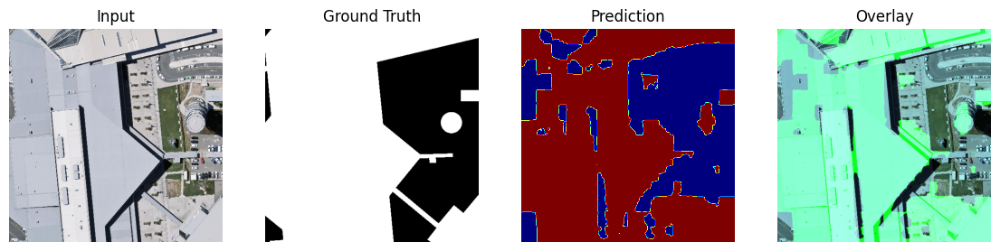

⏳ No improvement for 2 epochs…


Validation: 100%|██████████| 154/154 [00:32<00:00,  4.77it/s]


🔥 Epoch 4/40 — TrainLoss=0.1904 | ValIoU=0.1493
⏳ No improvement for 3 epochs…


Validation: 100%|██████████| 154/154 [00:32<00:00,  4.79it/s]


🔥 Epoch 5/40 — TrainLoss=0.1547 | ValIoU=0.1493
⏳ No improvement for 4 epochs…


Validation: 100%|██████████| 154/154 [00:32<00:00,  4.74it/s]


🔥 Epoch 6/40 — TrainLoss=0.1317 | ValIoU=0.1493
📸 Visualization:


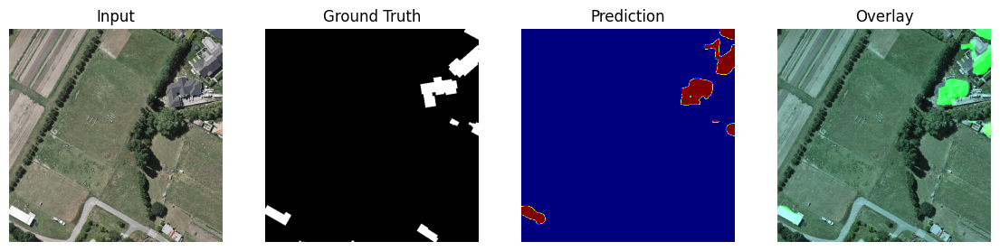

⏳ No improvement for 5 epochs…


Validation: 100%|██████████| 154/154 [00:32<00:00,  4.77it/s]


🔥 Epoch 7/40 — TrainLoss=0.1128 | ValIoU=0.1493
⏳ No improvement for 6 epochs…
🛑 Early stopping triggered at epoch 7
🏁 Segmentation training complete.
🟠 Generating pseudo labels...


Pseudo-labeling: 100%|██████████| 154/154 [00:44<00:00,  3.45it/s]


✅ Saved pseudo labels in pseudo_masks/
🟣 Fine-tuning with pseudo labels…


Finetune Validation: 100%|██████████| 154/154 [00:31<00:00,  4.84it/s]


🔥 Finetune Epoch 1/20 — Loss=0.3429 | ValIoU=0.1493
💾 Saved finetuned BEST → seg_finetuned_best.pth


Finetune Validation: 100%|██████████| 154/154 [00:31<00:00,  4.89it/s]


🔥 Finetune Epoch 2/20 — Loss=0.2579 | ValIoU=0.1493
⏳ No improvement for 1 epochs…


Finetune Validation: 100%|██████████| 154/154 [00:31<00:00,  4.85it/s]


🔥 Finetune Epoch 3/20 — Loss=0.2360 | ValIoU=0.1493
📸 Visualization (finetune):


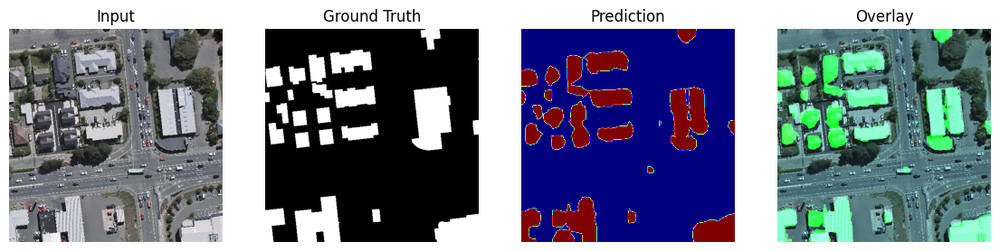

⏳ No improvement for 2 epochs…


Finetune Validation: 100%|██████████| 154/154 [00:31<00:00,  4.93it/s]


🔥 Finetune Epoch 4/20 — Loss=0.2208 | ValIoU=0.1493
⏳ No improvement for 3 epochs…


Finetune Validation: 100%|██████████| 154/154 [00:32<00:00,  4.81it/s]


🔥 Finetune Epoch 5/20 — Loss=0.2099 | ValIoU=0.1493
⏳ No improvement for 4 epochs…


Finetune Validation: 100%|██████████| 154/154 [00:31<00:00,  4.86it/s]


🔥 Finetune Epoch 6/20 — Loss=0.1973 | ValIoU=0.1493
📸 Visualization (finetune):


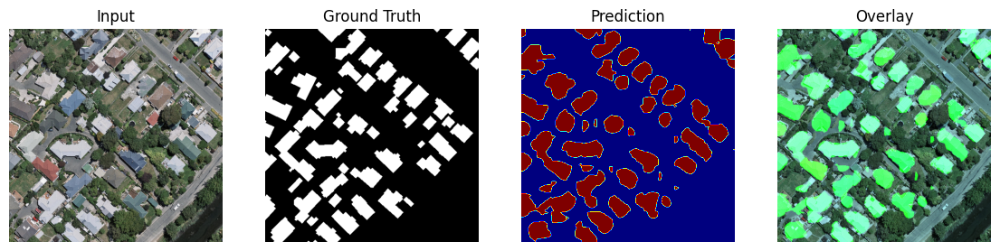

⏳ No improvement for 5 epochs…


Finetune Validation: 100%|██████████| 154/154 [00:31<00:00,  4.92it/s]

🔥 Finetune Epoch 7/20 — Loss=0.1725 | ValIoU=0.1493
⏳ No improvement for 6 epochs…
🛑 Early stopping triggered during finetuning
🏁 Fine-tuning completed.


In [16]:
pretrain_encoder(epochs=20, chunk_size=16) # 20 ep

train_segmentation(epochs=40, chunk_size=8, labeled_fraction=0.10) #40

generate_pseudo_labels(confidence=0.90)

finetune_with_pseudo(epochs=20, chunk_size=8) #20


In [17]:
# generate_pseudo_labels(confidence=0.90)

In [18]:
# finetune_with_pseudo(epochs=2, chunk_size=8) #20


Device: cuda
Loaded checkpoint: seg_finetuned_best.pth


Evaluating: 100%|██████████| 154/154 [03:38<00:00,  1.42s/it, mean_iou=0.654, mean_f1=0.765]



==== TEST SUMMARY ====
Images evaluated : 1228
Mean IoU  : 0.6543
Mean Prec : 0.8716
Mean Rec  : 0.7168
Mean F1   : 0.7645
Mean Acc  : 0.9357
Per-image CSV saved to: eval_results/eval_summary.csv
Visuals saved to: eval_results/visuals


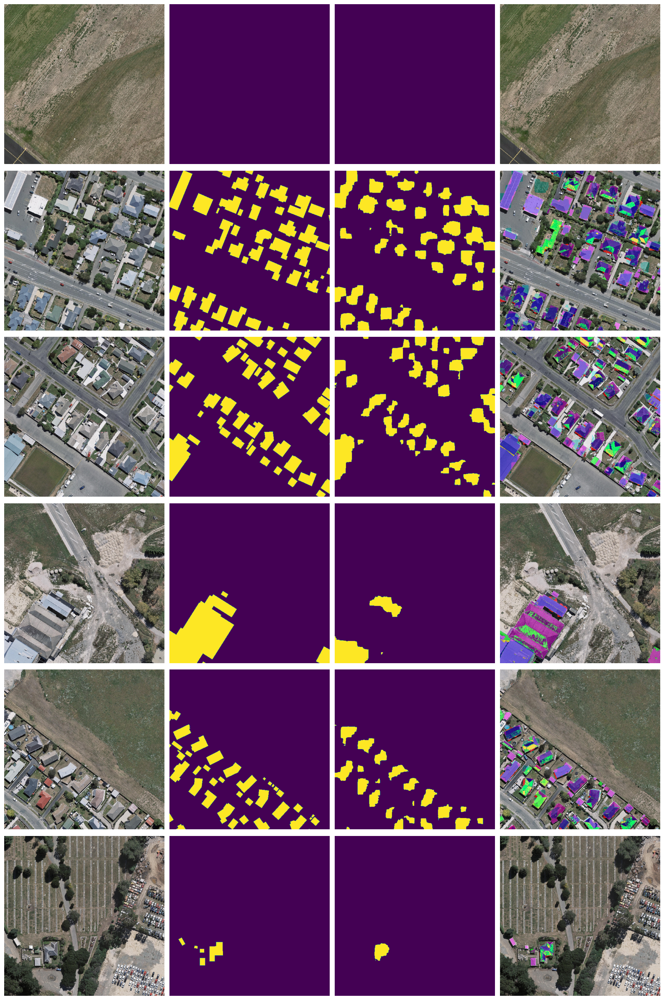

In [19]:
# -----------------------
# EVALUATE ON TEST SET
# Drop this single cell into your notebook
# -----------------------
import os
import csv
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

# ---- USER SETTINGS ----
ckpt_path = "seg_finetuned_best.pth"   # change to your trained checkpoint if different
batch_size = 8                    # use GPU-friendly batch
thr = 0.5                         # threshold for binarizing predictions
save_visuals = True               # save example visualizations (True/False)
visuals_dir = "eval_results/visuals"
csv_path = "eval_results/eval_summary.csv"
img_size = 512                    # must match dataset resizing used in training

# ---- ensure directories ----
os.makedirs(os.path.dirname(csv_path) or ".", exist_ok=True)
if save_visuals:
    os.makedirs(visuals_dir, exist_ok=True)

# ---- device ----
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# ---- helper metric functions ----
def batch_metrics(pred_logits, masks, thr=0.5, eps=1e-7):
    """
    pred_logits: torch.Tensor [B,1,H,W]
    masks:       torch.Tensor [B,1,H,W] (0/1)
    returns per-batch lists: iou_list, prec_list, rec_list, f1_list, acc_list
    """
    with torch.no_grad():
        probs = torch.sigmoid(pred_logits)
        preds = (probs > thr).float()
        masks = masks.float()

        # flatten per image
        preds_flat = preds.view(preds.shape[0], -1)
        masks_flat = masks.view(masks.shape[0], -1)

        tp = (preds_flat * masks_flat).sum(dim=1)
        fp = (preds_flat * (1 - masks_flat)).sum(dim=1)
        fn = ((1 - preds_flat) * masks_flat).sum(dim=1)
        tn = ((1 - preds_flat) * (1 - masks_flat)).sum(dim=1)

        iou = (tp + eps) / (tp + fp + fn + eps)
        prec = (tp + eps) / (tp + fp + eps)
        rec  = (tp + eps) / (tp + fn + eps)
        f1   = 2 * prec * rec / (prec + rec + eps)
        acc  = (tp + tn) / (tp + tn + fp + fn + eps)

        # convert to python floats
        return [float(x) for x in iou], [float(x) for x in prec], [float(x) for x in rec], [float(x) for x in f1], [float(x) for x in acc]

# ---- visualization helper ----
def save_visual_pair(image_tensor, gt_mask_tensor, pred_mask_tensor, out_path_base):
    """
    image_tensor: [3,H,W] in 0..1
    gt_mask_tensor, pred_mask_tensor: [1,H,W]
    """

    # ---- Convert image ----
    img = (image_tensor.cpu().numpy().transpose(1,2,0) * 255).astype(np.uint8)

    # ---- Convert masks ----
    gt = (gt_mask_tensor.squeeze().cpu().numpy() > 0.5).astype(np.uint8) * 255
    pred = (pred_mask_tensor.squeeze().cpu().numpy() > 0.5).astype(np.uint8) * 255

    # gt, pred now are [H,W] arrays → good for PIL
    Image.fromarray(img).save(out_path_base + "_img.png")
    Image.fromarray(gt).save(out_path_base + "_gt.png")
    Image.fromarray(pred).save(out_path_base + "_pred.png")

    # ---- Overlay (red=pred, green=gt) ----
    overlay = img.copy()

    gt_bool = gt > 0
    pred_bool = pred > 0

    overlay[gt_bool, 1] = np.clip(overlay[gt_bool,1] + 150, 0, 255)   # green
    overlay[pred_bool, 0] = np.clip(overlay[pred_bool,0] + 180, 0, 255)  # red

    Image.fromarray(overlay).save(out_path_base + "_overlay.png")


# ---- dataset -> DataLoader for test set ----
# We expect a WHUDataset(image_paths, mask_paths, img_size) from your notebook code.
# If your dataset class has a different signature, adapt the creation lines below.

test_imgs = sorted(glob.glob(TEST_IMG + "/*.png"))
test_masks = sorted(glob.glob(TEST_MASK + "/*.png"))

assert len(test_imgs) == len(test_masks), "Test images and masks count mismatch!"

test_ds = WHUDataset(test_imgs, test_masks, img_size=img_size)
test_dl = DataLoader(test_ds, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

# ---- model instantiation & load checkpoint ----
# We expect UNetViT() to be defined in the notebook (same architecture used in training).
model = UNetViT().to(device)
if not os.path.exists(ckpt_path):
    raise FileNotFoundError(f"Checkpoint not found: {ckpt_path}")

state = torch.load(ckpt_path, map_location=device)
# If checkpoint contains state_dict nested (e.g., {"model": state_dict}), handle both:
if isinstance(state, dict) and any(k.startswith("model") or k.startswith("module") for k in state.keys()):
    # try to guess where weights are
    # Common cases: saved model itself (state_dict), or {"model": state_dict}
    if "model" in state and isinstance(state["model"], dict):
        state_dict = state["model"]
    else:
        # if saved raw state dict, use it directly
        state_dict = state
else:
    state_dict = state

# handle DataParallel 'module.' prefix
from collections import OrderedDict
new_state = OrderedDict()
for k, v in state_dict.items():
    new_k = k.replace("module.", "") if k.startswith("module.") else k
    new_state[new_k] = v

model.load_state_dict(new_state, strict=False)  # allow missing if decoder heads differ
model.eval()
print("Loaded checkpoint:", ckpt_path)

# ---- iterate test set and compute metrics ----
rows = []
agg_iou = []
agg_prec = []
agg_rec = []
agg_f1 = []
agg_acc = []

with torch.no_grad():
    pbar = tqdm(enumerate(test_dl), total=len(test_dl), desc="Evaluating")
    for batch_idx, data in pbar:
        if isinstance(data, (list, tuple)):
            imgs, masks = data
        else:
            # if dataset returned a dict-like object, adapt accordingly
            raise RuntimeError("Expected dataset to return (img, mask) tuples")

        imgs = imgs.to(device)
        masks = masks.to(device)

        logits = model(imgs)                       # raw logits [B,1,H,W]
        # ensure same size
        if logits.shape[-2:] != masks.shape[-2:]:
            logits = F.interpolate(logits, size=masks.shape[-2:], mode='bilinear', align_corners=False)

        # compute metrics per image within batch
        iou_list, prec_list, rec_list, f1_list, acc_list = batch_metrics(logits, masks, thr=thr)

        # append aggregated lists
        agg_iou.extend(iou_list)
        agg_prec.extend(prec_list)
        agg_rec.extend(rec_list)
        agg_f1.extend(f1_list)
        agg_acc.extend(acc_list)

        # save per-image rows and optionally visualize
        B = imgs.shape[0]
        for bi in range(B):
            global_idx = batch_idx * batch_size + bi
            img_path = test_imgs[global_idx]
            mask_path = test_masks[global_idx]
            filename = os.path.splitext(os.path.basename(img_path))[0]

            row = {
                "filename": filename,
                "image_path": img_path,
                "mask_path": mask_path,
                "iou": iou_list[bi],
                "precision": prec_list[bi],
                "recall": rec_list[bi],
                "f1": f1_list[bi],
                "accuracy": acc_list[bi]
            }
            rows.append(row)

            if save_visuals:
                # create predicted binary mask tensor for saving visuals
                probs = torch.sigmoid(logits[bi:bi+1])
                pred_bin = (probs > thr).float().cpu()
                save_visual_pair(imgs[bi].cpu(), masks[bi].cpu(), pred_bin, os.path.join(visuals_dir, filename))

        # update progress bar description with running averages
        pbar.set_postfix({
            "mean_iou": np.mean(agg_iou) if len(agg_iou)>0 else 0.0,
            "mean_f1": np.mean(agg_f1) if len(agg_f1)>0 else 0.0
        })

# ---- aggregate results ----
mean_iou = float(np.mean(agg_iou))
mean_prec = float(np.mean(agg_prec))
mean_rec  = float(np.mean(agg_rec))
mean_f1   = float(np.mean(agg_f1))
mean_acc  = float(np.mean(agg_acc))

print("\n==== TEST SUMMARY ====")
print(f"Images evaluated : {len(rows)}")
print(f"Mean IoU  : {mean_iou:.4f}")
print(f"Mean Prec : {mean_prec:.4f}")
print(f"Mean Rec  : {mean_rec:.4f}")
print(f"Mean F1   : {mean_f1:.4f}")
print(f"Mean Acc  : {mean_acc:.4f}")

# ---- write CSV summary ----
with open(csv_path, "w", newline="") as csvfile:
    fieldnames = ["filename","image_path","mask_path","iou","precision","recall","f1","accuracy"]
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    writer.writeheader()
    for r in rows:
        writer.writerow(r)

print("Per-image CSV saved to:", csv_path)
if save_visuals:
    print("Visuals saved to:", visuals_dir)

# ---- show a few sample overlays inline (3 random samples) ----
import random
samples = rows if len(rows) <= 6 else random.sample(rows, 6)
fig_rows = len(samples)
fig, axes = plt.subplots(fig_rows, 4, figsize=(16, 4*fig_rows))
if fig_rows == 1:
    axes = axes.reshape(1,4)

for i, r in enumerate(samples):
    base = os.path.splitext(os.path.basename(r["image_path"]))[0]
    img_p = os.path.join(visuals_dir, base + "_img.png")
    gt_p  = os.path.join(visuals_dir, base + "_gt.png")
    pred_p= os.path.join(visuals_dir, base + "_pred.png")
    over_p= os.path.join(visuals_dir, base + "_overlay.png")

    for j, path in enumerate([img_p, gt_p, pred_p, over_p]):
        if os.path.exists(path):
            axes[i, j].imshow(Image.open(path))
            axes[i, j].axis("off")
        else:
            axes[i, j].text(0.5,0.5,"missing",ha="center")
            axes[i, j].axis("off")

plt.tight_layout()
plt.show()


Loaded model: seg_finetuned_best.pth
Saving visualizations to: visualization_examples
Generating 12 visual samples...


100%|██████████| 12/12 [00:02<00:00,  4.56it/s]


Visualization completed!
Displaying a grid of some samples...


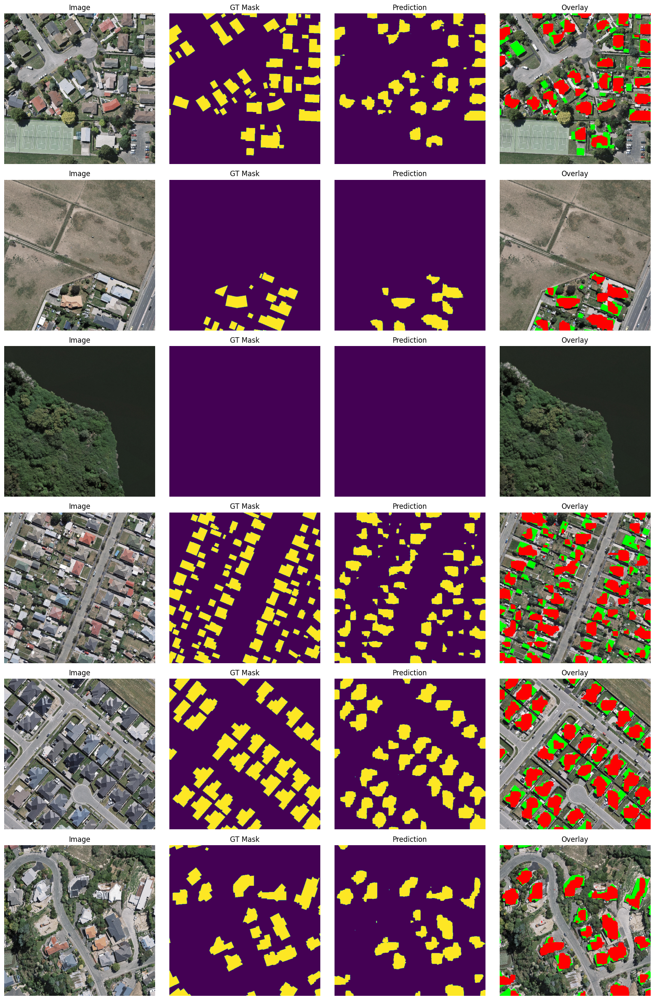

In [20]:
# ============================================================
# STEP 6 — VISUALIZE PREDICTIONS (HIGH QUALITY)
# ============================================================
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn.functional as F

# ---- CONFIG ----
vis_ckpt = "seg_finetuned_best.pth"     # your best checkpoint
num_samples = 12                        # how many samples to visualize
save_dir = "visualization_examples"     # folder to save visualizations
thr = 0.5                                # threshold for prediction
img_size = 512

os.makedirs(save_dir, exist_ok=True)

# ---- Load test set ----
test_imgs = sorted(glob.glob(TEST_IMG + "/*.png"))
test_masks = sorted(glob.glob(TEST_MASK + "/*.png"))

# ---- Dataset loader ----
test_ds = WHUDataset(test_imgs, test_masks, img_size=img_size)
test_dl = DataLoader(test_ds, batch_size=1, shuffle=False)

# ---- Load Model ----
model = UNetViT().to(device)
state = torch.load(vis_ckpt, map_location=device)

# strip potential 'module.' prefix
clean_state = {k.replace("module.", ""): v for k, v in state.items()}
model.load_state_dict(clean_state, strict=False)
model.eval()

print("Loaded model:", vis_ckpt)
print("Saving visualizations to:", save_dir)


# ---- HELPER: generate overlay & heatmaps ----
def make_visuals(img, gt, pred_mask, out_base):
    """
    img: [3,H,W] original
    gt: [1,H,W]
    pred_mask: [1,H,W]
    """

    img_np = (img.cpu().numpy().transpose(1,2,0) * 255).astype(np.uint8)
    H, W = img_np.shape[:2]

    gt_np = (gt.squeeze().cpu().numpy() > 0.5).astype(np.uint8)
    pred_np = (pred_mask.squeeze().cpu().numpy() > 0.5).astype(np.uint8)

    # SAVE mask images
    Image.fromarray(img_np).save(out_base + "_img.png")
    Image.fromarray((gt_np * 255).astype(np.uint8)).save(out_base + "_gt.png")
    Image.fromarray((pred_np * 255).astype(np.uint8)).save(out_base + "_pred.png")

    # ---- Overlay: GT=Green, Pred=Red ----
    overlay = img_np.copy()
    overlay[gt_np == 1] = [0, 255, 0]
    overlay[pred_np == 1] = [255, 0, 0]
    Image.fromarray(overlay).save(out_base + "_overlay.png")

    # ---- FP / FN heatmap ----
    fp = np.logical_and(pred_np == 1, gt_np == 0)
    fn = np.logical_and(pred_np == 0, gt_np == 1)
    tp = np.logical_and(pred_np == 1, gt_np == 1)

    fp_img = np.zeros((H, W, 3), dtype=np.uint8)
    fn_img = np.zeros((H, W, 3), dtype=np.uint8)
    tp_img = np.zeros((H, W, 3), dtype=np.uint8)

    fp_img[fp] = [255, 0, 0]     # red
    fn_img[fn] = [0, 0, 255]     # blue
    tp_img[tp] = [0, 255, 0]     # green

    Image.fromarray(fp_img).save(out_base + "_FP.png")
    Image.fromarray(fn_img).save(out_base + "_FN.png")
    Image.fromarray(tp_img).save(out_base + "_TP.png")

    # Combine: FP red, FN blue, TP green
    combined = fp_img + fn_img + tp_img
    Image.fromarray(combined).save(out_base + "_errors.png")

    return img_np, gt_np, pred_np, overlay, combined


# ------------------------------------------------------------
# RUN VISUALIZATION
# ------------------------------------------------------------

chosen_indices = np.random.choice(len(test_ds), num_samples, replace=False)

print(f"Generating {num_samples} visual samples...")

for idx in tqdm(chosen_indices):
    img, mask = test_ds[idx]
    img_t = img.unsqueeze(0).to(device)
    mask_t = mask.to(device)

    with torch.no_grad():
        pred = torch.sigmoid(model(img_t))
        pred = F.interpolate(pred, size=(img_size, img_size), mode='bilinear')

    pred_mask = (pred > thr).float()

    filename = os.path.splitext(os.path.basename(test_imgs[idx]))[0]
    out_base = os.path.join(save_dir, filename)

    make_visuals(img, mask, pred_mask, out_base)

print("Visualization completed!")

# ------------------------------------------------------------
# PLOT RANDOM GRID IN NOTEBOOK
# ------------------------------------------------------------

print("Displaying a grid of some samples...")

grid_samples = np.random.choice(chosen_indices, min(6, len(chosen_indices)), replace=False)
fig, axes = plt.subplots(len(grid_samples), 4, figsize=(16, 4 * len(grid_samples)))

if len(grid_samples) == 1:
    axes = [axes]

for i, idx in enumerate(grid_samples):
    base = os.path.splitext(os.path.basename(test_imgs[idx]))[0]
    paths = [
        os.path.join(save_dir, base + "_img.png"),
        os.path.join(save_dir, base + "_gt.png"),
        os.path.join(save_dir, base + "_pred.png"),
        os.path.join(save_dir, base + "_overlay.png"),
    ]
    titles = ["Image", "GT Mask", "Prediction", "Overlay"]

    for ax, p, t in zip(axes[i], paths, titles):
        ax.imshow(Image.open(p))
        ax.set_title(t)
        ax.axis("off")

plt.tight_layout()
plt.show()


Model loaded from seg_finetuned_best.pth -> device: cuda
Test images: 1228


Inference: 100%|██████████| 307/307 [01:25<00:00,  3.58it/s]



=== ROI Extraction Summary ===
Test images processed : 1228
Original total size   : 743.43 MB
Tiles archive size    : 217.77 MB
Size reduction factor : 3.41x
GT building pixels    : 49962704
Preserved GT pixels   : 34833769 -> coverage 69.72%
Elapsed time (sec)    : 101.1
Tiles saved in        : roi_output/tiles
Archive saved as      : roi_output/roi_tiles.tar.gz
Metadata JSON         : roi_output/tiles_metadata.json


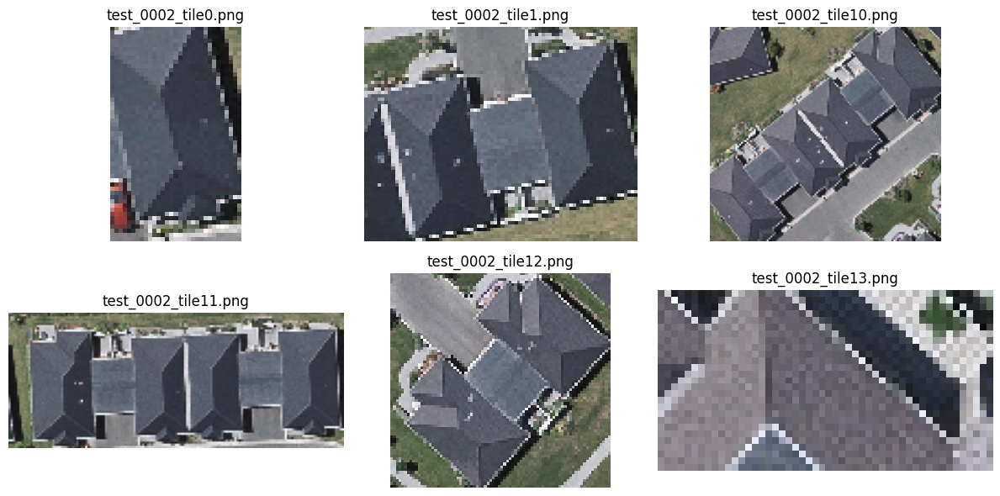

In [21]:
# =============================
# STEP 7 — ROI EXTRACTION & COMPRESSION
# =============================
import os, json, math, shutil, glob, time
from tqdm import tqdm
import numpy as np
from PIL import Image
import cv2
import torch
import torch.nn.functional as F
from torchvision import transforms

# ---- CONFIG ----
ckpt_path = "seg_finetuned_best.pth"   # best segmentation checkpoint
out_root = "roi_output"                # where to save crops + meta + archive
visuals_out = os.path.join(out_root, "samples")
tiles_out = os.path.join(out_root, "tiles")
meta_path = os.path.join(out_root, "tiles_metadata.json")
archive_name = os.path.join(out_root, "roi_tiles.tar.gz")  # compressed ROI payload

device = "cuda" if torch.cuda.is_available() else "cpu"
img_size = 512           # model was trained/resized to this size
thr = 0.5                # threshold for mask binarization
min_area = 300          # minimum connected-component area (pixels) to keep (tune)
merge_iou_thr = 0.2     # merge boxes if IoU > this (helps small neighboring pieces)
tile_pad = 8            # padding around each box when cropping (pixels)
batch_size = 4

os.makedirs(out_root, exist_ok=True)
os.makedirs(tiles_out, exist_ok=True)
os.makedirs(visuals_out, exist_ok=True)

# ---- Helpers: IoU & merge boxes ----
def box_iou(a, b):
    # a,b = [x1,y1,x2,y2]
    xa1,ya1,xa2,ya2 = a; xb1,yb1,xb2,yb2 = b
    ix1,iy1 = max(xa1,xb1), max(ya1,yb1)
    ix2,iy2 = min(xa2,xb2), min(ya2,yb2)
    iw, ih = max(0, ix2-ix1+1), max(0, iy2-iy1+1)
    inter = iw * ih
    area_a = (xa2-xa1+1)*(ya2-ya1+1)
    area_b = (xb2-xb1+1)*(yb2-yb1+1)
    union = area_a + area_b - inter
    return inter / union if union>0 else 0.0

def merge_boxes(boxes, iou_thr=0.2):
    if len(boxes) == 0:
        return []
    boxes = boxes.copy()
    merged = []
    while boxes:
        base = boxes.pop(0)
        bx1,by1,bx2,by2 = base
        i = 0
        while i < len(boxes):
            if box_iou(base, boxes[i]) > iou_thr:
                # merge
                o = boxes.pop(i)
                bx1 = min(bx1, o[0]); by1 = min(by1, o[1])
                bx2 = max(bx2, o[2]); by2 = max(by2, o[3])
                base = [bx1,by1,bx2,by2]
                i = 0  # restart
            else:
                i += 1
        merged.append(base)
    return merged

# ---- Load model (UNetViT from your notebook) ----
model = UNetViT().to(device)
state = torch.load(ckpt_path, map_location=device)
clean_state = {k.replace("module.", ""): v for k, v in state.items()}
model.load_state_dict(clean_state, strict=False)
model.eval()
print("Model loaded from", ckpt_path, "-> device:", device)

# ---- Utility: normalize PIL->Tensor (same as training) ----
def pil_to_tensor(img_pil, size=img_size):
    img = img_pil.resize((size,size), Image.BILINEAR)
    arr = np.array(img).astype(np.float32) / 255.0
    t = torch.tensor(arr).permute(2,0,1).unsqueeze(0)
    return t

# ---- Gather inputs (test set) ----
test_img_paths = sorted(glob.glob(TEST_IMG + "/*.png"))
test_mask_paths = sorted(glob.glob(TEST_MASK + "/*.png"))  # for coverage evaluation
assert len(test_img_paths) == len(test_mask_paths), "Test set mismatch"

n_images = len(test_img_paths)
print(f"Test images: {n_images}")

# ---- Run inference in batches, extract CCs ----
metadata = []
total_gt_pixels = 0
total_preserved_gt_pixels = 0
orig_total_size = 0
start_time = time.time()

# we'll run over test dataset in minibatches to use gpu efficiently
for i in tqdm(range(0, n_images, batch_size), desc="Inference"):
    batch_paths = test_img_paths[i:i+batch_size]
    imgs = []
    orig_sizes = []
    for p in batch_paths:
        pil = Image.open(p).convert("RGB")
        orig_sizes.append(pil.size)  # (W,H)
        imgs.append(pil_to_tensor(pil, size=img_size))
    imgs_t = torch.cat(imgs, dim=0).to(device)

    with torch.no_grad():
        logits = model(imgs_t)             # [B,1,H,W] expected
        probs = torch.sigmoid(logits)
        probs = F.interpolate(probs, size=(img_size, img_size), mode='bilinear')
        probs_np = probs.cpu().numpy()    # (B,1,H,W)

    for b_idx, img_path in enumerate(batch_paths):
        filename = os.path.splitext(os.path.basename(img_path))[0]
        origW, origH = orig_sizes[b_idx]
        # load original full-res image (for cropping at original scale)
        orig_pil = Image.open(img_path).convert("RGB")
        orig_arr = np.array(orig_pil)
        orig_total_size += os.path.getsize(img_path)

        # get predicted mask (resized to img_size)
        pm = probs_np[b_idx,0]  # HxW float
        bin_mask = (pm > thr).astype(np.uint8)  # 0/1 (img_size x img_size)

        # load GT for coverage evaluation (resized to same img_size)
        gt_pil = Image.open(test_mask_paths[i + b_idx]).convert("L")
        gt_arr = np.array(gt_pil.resize((img_size, img_size), Image.NEAREST))//255
        total_gt_pixels += gt_arr.sum()
        preserved_pixels = (gt_arr * bin_mask).sum()
        total_preserved_gt_pixels += preserved_pixels

        # find connected components on bin_mask using cv2
        contours, _ = cv2.findContours(bin_mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        boxes = []
        for cnt in contours:
            x,y,w,h = cv2.boundingRect(cnt)
            area = w*h
            if area >= min_area:
                boxes.append([x, y, x+w-1, y+h-1])  # [x1,y1,x2,y2] in mask coords

        # optionally merge small close boxes (helps reduce many tiny tiles)
        boxes = merge_boxes(sorted(boxes), iou_thr=merge_iou_thr)

        # Save crops in original image resolution: map box coords from (img_size) back to (origW,origH)
        scale_x = origW / img_size
        scale_y = origH / img_size
        saved_tiles = []
        for j, box in enumerate(boxes):
            x1,y1,x2,y2 = box
            # pad in mask coords
            x1p = max(0, x1 - tile_pad); y1p = max(0, y1 - tile_pad)
            x2p = min(img_size-1, x2 + tile_pad); y2p = min(img_size-1, y2 + tile_pad)
            # map to original coords
            ox1 = int(round(x1p * scale_x)); oy1 = int(round(y1p * scale_y))
            ox2 = int(round((x2p) * scale_x)); oy2 = int(round((y2p) * scale_y))
            # clamp
            ox1 = max(0, min(ox1, origW-1)); oy1 = max(0, min(oy1, origH-1))
            ox2 = max(0, min(ox2, origW-1)); oy2 = max(0, min(oy2, origH-1))
            crop = orig_arr[oy1:oy2+1, ox1:ox2+1, :]
            tile_name = f"{filename}_tile{j}.png"
            tile_path = os.path.join(tiles_out, tile_name)
            Image.fromarray(crop).save(tile_path, optimize=True)
            saved_tiles.append({
                "tile_name": tile_name,
                "tile_path": tile_path,
                "orig_image": os.path.basename(img_path),
                "bbox_mask_coords": [int(x1p), int(y1p), int(x2p), int(y2p)],
                "bbox_orig_coords": [ox1, oy1, ox2, oy2],
                "area_mask_pixels": int((x2p-x1p+1) * (y2p-y1p+1))
            })

        metadata.append({
            "image": os.path.basename(img_path),
            "orig_size": [origW, origH],
            "pred_pixels": int(bin_mask.sum()),
            "gt_pixels": int(gt_arr.sum()),
            "preserved_gt_pixels": int(preserved_pixels),
            "num_tiles": len(saved_tiles),
            "tiles": saved_tiles
        })

# ---- Save metadata ----
with open(meta_path, "w") as f:
    json.dump(metadata, f, indent=2)

# ---- Compression: create archive of tiles folder ----
if os.path.exists(archive_name):
    os.remove(archive_name)
shutil.make_archive(base_name=archive_name.replace(".tar.gz",""), format='gztar', root_dir=tiles_out)

archive_size = os.path.getsize(archive_name)
orig_total_mb = orig_total_size / (1024*1024)
archive_mb = archive_size / (1024*1024)
coverage_frac = (total_preserved_gt_pixels / (total_gt_pixels + 1e-8)) if total_gt_pixels>0 else 0.0

elapsed = time.time() - start_time

# ---- Summary report ----
print("\n=== ROI Extraction Summary ===")
print(f"Test images processed : {n_images}")
print(f"Original total size   : {orig_total_mb:.2f} MB")
print(f"Tiles archive size    : {archive_mb:.2f} MB")
print(f"Size reduction factor : {orig_total_mb/archive_mb:.2f}x" if archive_mb>0 else "N/A")
print(f"GT building pixels    : {int(total_gt_pixels)}")
print(f"Preserved GT pixels   : {int(total_preserved_gt_pixels)} -> coverage {coverage_frac*100:.2f}%")
print(f"Elapsed time (sec)    : {elapsed:.1f}")
print(f"Tiles saved in        : {tiles_out}")
print(f"Archive saved as      : {archive_name}")
print(f"Metadata JSON         : {meta_path}")

# ---- Show a few saved tiles and overlay stats inline for sanity check ----
from matplotlib import pyplot as plt
plt.figure(figsize=(12,6))
show_n = 6
sample_tiles = sorted(glob.glob(os.path.join(tiles_out,"*.png")))[:show_n]
for idx, tpath in enumerate(sample_tiles):
    img = Image.open(tpath)
    plt.subplot(2, math.ceil(show_n/2), idx+1)
    plt.imshow(img); plt.axis('off'); plt.title(os.path.basename(tpath))
plt.tight_layout()
plt.show()

# done


In [22]:
# --- Put this single cell into your notebook and run ---
import os, io, json, tarfile, math, shutil
from pathlib import Path
from tqdm import tqdm
from PIL import Image
import numpy as np
import torch
import torch.nn.functional as F
from torchvision import transforms
import cv2

# -------------------- CONFIG --------------------
# Change these to your environment
TRAIN_IMG = "/kaggle/input/whu-building-dataset/WHU/train/Image"
VAL_IMG   = "/kaggle/input/whu-building-dataset/WHU/val/Image"
TEST_IMG  = "/kaggle/input/whu-building-dataset/WHU/test/Image"

# Example model checkpoint name (change if needed)
MODEL_PATH = "seg_finetuned_best.pth"   # or your checkpoint path
OUT_DIR = "transmission_package"        # where outputs will be saved

# Inference params
THRESH = 0.5            # segmentation threshold
PREVIEW_SIZE = (128,128)  # small preview (width, height)
TILE_SIZE = 256         # max tile edge to crop (will split large bbox)
PADDING = 8             # padding around bbox in pixels
MIN_AREA = 16           # minimal building pixel area to keep a bbox
BATCH_SIZE = 8          # for model batched predictions
NUM_WORKERS = 0         # no dataloader workers here (simple)
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
PRINT_INTERVAL = 50

# -------------------- HELPERS --------------------
def make_predict_fn_from_model(model, device=DEVICE):
    """
    Wrap a PyTorch segmentation model that returns logits for an input tensor [B,3,H,W].
    Model must output [B,1,H,W] logits or similar. Returns predict_fn(images_tensor) -> logits.
    """
    model = model.to(device)
    model.eval()
    @torch.no_grad()
    def predict_fn(x):
        # x is tensor [B,3,H,W] float in [0,1] or [0,255]
        if x.dtype == torch.uint8:
            x = x.float() / 255.0
        x = x.to(device)
        out = model(x)   # assume raw logits
        if isinstance(out, (tuple, list)):
            out = out[0]
        # Ensure shape [B,1,H,W]
        if out.dim()==4 and out.size(1)>1:
            # if model outputs C>1 probabilities, choose building class index 1 or sum, here we attempt channel 1
            out = out[:,0:1,:,:]
        return out.detach().cpu()
    return predict_fn

def load_image_as_tensor(path, target_size=None):
    """Return torch tensor [1,3,H,W], float in [0,1]"""
    img = Image.open(path).convert("RGB")
    if target_size is not None:
        img = img.resize(target_size, Image.BILINEAR)
    arr = np.array(img).astype(np.float32) / 255.0
    t = torch.from_numpy(arr).permute(2,0,1).unsqueeze(0)  # [1,3,H,W]
    return t

def save_png_mask(mask_uint8, path):
    # mask_uint8 shape (H,W) values 0/255
    Image.fromarray(mask_uint8).save(path)

def save_preview(img_pil, preview_path, preview_size=PREVIEW_SIZE):
    img = img_pil.copy()
    img.thumbnail(preview_size, Image.BILINEAR)
    img.save(preview_path, quality=85)

def mask_to_bboxes(mask_bin):
    """
    mask_bin: numpy uint8 0/1 shape (H,W)
    returns list of bboxes (x1,y1,x2,y2)
    """
    # find contours with OpenCV
    mask_cv = (mask_bin*255).astype(np.uint8)
    contours, _ = cv2.findContours(mask_cv, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    bboxes = []
    for c in contours:
        x,y,w,h = cv2.boundingRect(c)
        bboxes.append([x,y,x+w-1,y+h-1])
    return bboxes

def pad_bbox(bbox, pad, h, w):
    x1,y1,x2,y2 = bbox
    x1 = max(0, x1 - pad)
    y1 = max(0, y1 - pad)
    x2 = min(w-1, x2 + pad)
    y2 = min(h-1, y2 + pad)
    return [x1,y1,x2,y2]

def crop_and_save_tile(img_arr, out_path, bbox):
    x1,y1,x2,y2 = bbox
    crop = img_arr[y1:y2+1, x1:x2+1, :]
    Image.fromarray((crop*255).astype(np.uint8)).save(out_path, quality=90)

# -------------------- MAIN PROCESSING --------------------
def process_single_image(img_path, predict_fn, out_root=OUT_DIR, thr=THRESH,
                         preview_size=PREVIEW_SIZE, tile_size=TILE_SIZE, padding=PADDING, min_area=MIN_AREA):
    """
    For one image: produce mask, preview, tiles, metadata.
    Returns metadata dict.
    """
    out_root = Path(out_root)
    out_root.mkdir(parents=True, exist_ok=True)

    img_pil = Image.open(img_path).convert("RGB")
    W0, H0 = img_pil.size
    # model might expect fixed size; we will feed original size but if predict_fn requires 512 we keep same size.
    # try to infer H,W from first call: here we send image at native size but batch predict_fn may expect 512x512.
    img_t = load_image_as_tensor(img_path, target_size=None)  # [1,3,H,W]
    logits = predict_fn(img_t)  # [1,1,H,W] on CPU
    # If logits shape differs from input spatial, resize to original
    _,_,h_out,w_out = logits.shape
    if (w_out != W0) or (h_out != H0):
        # rescale logits to original
        logits_resized = F.interpolate(logits, size=(H0, W0), mode="bilinear", align_corners=False)
    else:
        logits_resized = logits
    prob = torch.sigmoid(logits_resized[0,0]).numpy()  # (H,W)
    mask_bin = (prob > thr).astype(np.uint8)
    mask_uint8 = (mask_bin * 255).astype(np.uint8)

    base_name = Path(img_path).stem
    base_dir = out_root / base_name
    base_dir.mkdir(parents=True, exist_ok=True)

    # save mask
    mask_path = base_dir / f"{base_name}_mask.png"
    save_png_mask(mask_uint8, mask_path)

    # save preview
    preview_path = base_dir / f"{base_name}_preview.jpg"
    save_preview(img_pil, preview_path, preview_size)

    # compute bboxes
    bboxes = mask_to_bboxes(mask_bin)
    # filter small areas
    filtered = []
    for bb in bboxes:
        x1,y1,x2,y2 = bb
        area = (x2-x1+1)*(y2-y1+1)
        if area >= min_area:
            filtered.append(bb)
    bboxes = filtered

    h, w = mask_bin.shape
    tile_files = []
    tiles_dir = base_dir / "tiles"
    tiles_dir.mkdir(exist_ok=True)

    # For each bbox possibly split into tiles if too large
    for i, bb in enumerate(bboxes):
        bb = pad_bbox(bb, padding, h, w)
        x1,y1,x2,y2 = bb
        bw = x2-x1+1
        bh = y2-y1+1
        # if bbox larger than tile_size, split into grid of tiles
        nx = max(1, math.ceil(bw / tile_size))
        ny = max(1, math.ceil(bh / tile_size))
        step_x = math.ceil(bw / nx)
        step_y = math.ceil(bh / ny)
        for ix in range(nx):
            for iy in range(ny):
                sx = x1 + ix*step_x
                sy = y1 + iy*step_y
                ex = min(x2, sx + step_x - 1)
                ey = min(y2, sy + step_y - 1)
                tile_bbox = [sx, sy, ex, ey]
                tile_name = f"{base_name}_tile_{i}_{ix}_{iy}.png"
                tile_path = tiles_dir / tile_name
                # crop from original img
                arr = np.array(img_pil).astype(np.float32)/255.0
                crop_and_save_tile(arr, tile_path, tile_bbox)
                tile_files.append(str(tile_path.relative_to(out_root)))
    # create metadata
    metadata = {
        "image": str(Path(img_path).resolve()),
        "orig_size": [W0, H0],
        "mask_path": str(mask_path.name),
        "preview_path": str(preview_path.name),
        "tiles_dir": "tiles",
        "tiles": tile_files,
        "bboxes": bboxes,
        "threshold": thr,
        "padding": padding
    }

    # write metadata JSON
    with open(base_dir / f"{base_name}_meta.json", "w") as f:
        json.dump(metadata, f, indent=2)

    # create a compressed archive of mask + preview + tiles + metadata for transmission
    tar_path = out_root / f"{base_name}_package.tar.gz"
    with tarfile.open(tar_path, "w:gz") as tar:
        # add files relative to base_dir root, to avoid absolute paths inside tar
        for p in [mask_path, preview_path, base_dir / f"{base_name}_meta.json"]:
            tar.add(str(p), arcname=os.path.join(base_name, os.path.basename(str(p))))
        # add tiles dir
        if os.path.exists(str(tiles_dir)):
            for t in sorted(tiles_dir.iterdir()):
                tar.add(str(t), arcname=os.path.join(base_name, "tiles", t.name))

    metadata["package"] = str(tar_path.name)
    # also save small manifest in base dir containing final package name
    with open(base_dir / "manifest.json", "w") as f:
        json.dump({"package": str(tar_path.name), "mask": str(mask_path.name), "preview": str(preview_path.name)}, f)

    return metadata

def process_dataset(image_folder, predict_fn, out_root=OUT_DIR, limit=None, **kwargs):
    image_folder = Path(image_folder)
    imgs = sorted([str(p) for p in image_folder.glob("*.png")])
    if limit is not None:
        imgs = imgs[:limit]
    out_root = Path(out_root)
    out_root.mkdir(parents=True, exist_ok=True)
    manifest = []
    for i, img in enumerate(tqdm(imgs, desc="Processing images")):
        meta = process_single_image(img, predict_fn, out_root=out_root, **kwargs)
        manifest.append(meta)
        if (i+1) % PRINT_INTERVAL == 0:
            print(f"[{i+1}/{len(imgs)}] processed, last: {Path(img).stem}")
    # save overall manifest
    with open(out_root / "dataset_manifest.json", "w") as f:
        json.dump(manifest, f, indent=2)
    print("All done. Packages created under:", str(out_root))
    return manifest

# -------------------- VISUAL DEBUG (inline helper) --------------------
def visualize_sample_from_package(base_dir, base_name, out_jpg="sample_vis.jpg", thr=THRESH):
    """
    Read mask and preview and create a visualization image with overlay.
    """
    base_dir = Path(base_dir) / base_name
    img_path = next(base_dir.glob(base_name + "*.png"))  # picks original mask or image if available
    # prefer original image file in folder
    candidates = list(base_dir.glob(base_name + "_img*"))
    # but safer: find any image of original size - fallback to preview
    preview = base_dir / f"{base_name}_preview.jpg"
    mask = base_dir / f"{base_name}_mask.png"
    if not preview.exists() and img_path.exists():
        preview = img_path
    # load for overlay (using preview scaled up)
    im = Image.open(preview).convert("RGB").resize((512,512))
    mask_np = np.array(Image.open(mask).convert("L").resize((512,512))) > (thr*255)
    overlay = im.copy()
    ol = np.array(overlay)
    ol[mask_np, :] = (255, 0, 0)  # red where pred=1
    out = Image.fromarray(ol)
    out.save(os.path.join(base_dir, f"{base_name}_overlay.jpg"))
    return str(base_dir / f"{base_name}_overlay.jpg")

# -------------------- USAGE EXAMPLES --------------------
# Example 1: If you have a PyTorch model object named `model` loaded in notebook:
#
#   predict_fn = make_predict_fn_from_model(model, device=DEVICE)
#   manifest = process_dataset(TEST_IMG, predict_fn, out_root=OUT_DIR,
#                              thr=THRESH, preview_size=PREVIEW_SIZE,
#                              tile_size=TILE_SIZE, padding=PADDING, min_area=MIN_AREA)
#
# Example 2: If you prefer to load checkpoint and you have UNetViT class defined:
#
model = UNetViT().to(DEVICE)
model.load_state_dict(torch.load(MODEL_PATH))
predict_fn = make_predict_fn_from_model(model, device=DEVICE)
process_dataset(TEST_IMG, predict_fn)
#
# Example 3: If you have a custom predict function (must accept torch tensor and return logits CPU tensor)
#
#   def my_predict(x_batch):
#       # x_batch in [B,3,H,W], values float in [0,1]
#       # return logits [B,1,H,W] on CPU
#       ...
#   process_dataset(TEST_IMG, my_predict)
#
# -------------------- End of cell --------------------


Processing images:   4%|▍         | 51/1228 [00:06<01:48, 10.80it/s]

[50/1228] processed, last: test_0050


Processing images:   8%|▊         | 101/1228 [00:12<02:31,  7.43it/s]

[100/1228] processed, last: test_0100


Processing images:  12%|█▏        | 151/1228 [00:19<02:52,  6.25it/s]

[150/1228] processed, last: test_0150


Processing images:  16%|█▋        | 201/1228 [00:27<02:38,  6.46it/s]

[200/1228] processed, last: test_0200


Processing images:  20%|██        | 251/1228 [00:33<01:42,  9.51it/s]

[250/1228] processed, last: test_0250


Processing images:  25%|██▍       | 301/1228 [00:39<02:01,  7.60it/s]

[300/1228] processed, last: test_0300


Processing images:  29%|██▊       | 352/1228 [00:44<01:10, 12.48it/s]

[350/1228] processed, last: test_0350


Processing images:  33%|███▎      | 400/1228 [00:49<01:15, 10.96it/s]

[400/1228] processed, last: test_0400


Processing images:  37%|███▋      | 450/1228 [00:54<01:16, 10.12it/s]

[450/1228] processed, last: test_0450


Processing images:  41%|████      | 501/1228 [00:59<01:27,  8.31it/s]

[500/1228] processed, last: test_0500


Processing images:  45%|████▍     | 552/1228 [01:05<01:04, 10.49it/s]

[550/1228] processed, last: test_0550


Processing images:  49%|████▉     | 601/1228 [01:10<00:52, 12.02it/s]

[600/1228] processed, last: test_0600


Processing images:  53%|█████▎    | 651/1228 [01:16<01:02,  9.26it/s]

[650/1228] processed, last: test_0650


Processing images:  57%|█████▋    | 701/1228 [01:21<01:02,  8.47it/s]

[700/1228] processed, last: test_0700


Processing images:  61%|██████    | 751/1228 [01:28<01:04,  7.43it/s]

[750/1228] processed, last: test_0750


Processing images:  65%|██████▌   | 801/1228 [01:33<00:40, 10.45it/s]

[800/1228] processed, last: test_0800


Processing images:  69%|██████▉   | 851/1228 [01:40<00:40,  9.20it/s]

[850/1228] processed, last: test_0850


Processing images:  73%|███████▎  | 901/1228 [01:47<00:36,  9.02it/s]

[900/1228] processed, last: test_0900


Processing images:  78%|███████▊  | 952/1228 [01:52<00:31,  8.87it/s]

[950/1228] processed, last: test_0950


Processing images:  81%|████████▏ | 1000/1228 [01:57<00:21, 10.69it/s]

[1000/1228] processed, last: test_1000


Processing images:  86%|████████▌ | 1051/1228 [02:02<00:12, 13.84it/s]

[1050/1228] processed, last: test_1050


Processing images:  90%|████████▉ | 1103/1228 [02:07<00:08, 15.61it/s]

[1100/1228] processed, last: test_1100


Processing images:  94%|█████████▎| 1151/1228 [02:10<00:07, 10.29it/s]

[1150/1228] processed, last: test_1150


Processing images:  98%|█████████▊| 1201/1228 [02:15<00:02,  9.48it/s]

[1200/1228] processed, last: test_1200


Processing images: 100%|██████████| 1228/1228 [02:18<00:00,  8.87it/s]


All done. Packages created under: transmission_package


[{'image': '/kaggle/input/whu-building-dataset/WHU/test/Image/test_0001.png',
  'orig_size': [512, 512],
  'mask_path': 'test_0001_mask.png',
  'preview_path': 'test_0001_preview.jpg',
  'tiles_dir': 'tiles',
  'tiles': [],
  'bboxes': [],
  'threshold': 0.5,
  'padding': 8,
  'package': 'test_0001_package.tar.gz'},
 {'image': '/kaggle/input/whu-building-dataset/WHU/test/Image/test_0002.png',
  'orig_size': [512, 512],
  'mask_path': 'test_0002_mask.png',
  'preview_path': 'test_0002_preview.jpg',
  'tiles_dir': 'tiles',
  'tiles': ['test_0002/tiles/test_0002_tile_0_0_0.png',
   'test_0002/tiles/test_0002_tile_1_0_0.png',
   'test_0002/tiles/test_0002_tile_2_0_0.png',
   'test_0002/tiles/test_0002_tile_3_0_0.png',
   'test_0002/tiles/test_0002_tile_4_0_0.png',
   'test_0002/tiles/test_0002_tile_5_0_0.png',
   'test_0002/tiles/test_0002_tile_6_0_0.png',
   'test_0002/tiles/test_0002_tile_7_0_0.png',
   'test_0002/tiles/test_0002_tile_8_0_0.png',
   'test_0002/tiles/test_0002_tile_9_0_0.

In [23]:
# ============================
#  RUN ROI EXTRACTION PIPELINE
#  Using your UNetViT model
# ============================

# 1. Load model
print("📦 Loading UNetViT model + finetuned weights...")
model = UNetViT().to(DEVICE)

if not os.path.exists("seg_finetuned_best.pth"):
    raise FileNotFoundError("❌ seg_finetuned_best.pth not found in working directory!")

state = torch.load("seg_finetuned_best.pth", map_location=DEVICE)
model.load_state_dict(state)
print("✅ Model loaded.")

# 2. Build prediction function
predict_fn = make_predict_fn_from_model(model, device=DEVICE)
print("🔮 Prediction wrapper ready.")

# 3. Output directory
OUT_DIR = "roi_transmission_packages"
os.makedirs(OUT_DIR, exist_ok=True)

print(f"\n🚀 Starting ROI extraction + packaging on TEST set:")
print(f"Images: {TEST_IMG}")
print(f"Output → {OUT_DIR}\n")

# 4. Run pipeline
manifest = process_dataset(
    TEST_IMG,
    predict_fn,
    out_root=OUT_DIR,
    thr=0.5,               # threshold for binary mask
    preview_size=(128,128),
    tile_size=256,
    padding=8,
    min_area=16            # ignore tiny specks
)

print("\n🎉 DONE! All processed files in:", OUT_DIR)
print("📄 Manifest saved as dataset_manifest.json")


📦 Loading UNetViT model + finetuned weights...
✅ Model loaded.
🔮 Prediction wrapper ready.

🚀 Starting ROI extraction + packaging on TEST set:
Images: /kaggle/input/whu-building-dataset/WHU/test/Image
Output → roi_transmission_packages



Processing images:   4%|▍         | 51/1228 [00:06<01:52, 10.46it/s]

[50/1228] processed, last: test_0050


Processing images:   8%|▊         | 101/1228 [00:12<02:32,  7.41it/s]

[100/1228] processed, last: test_0100


Processing images:  12%|█▏        | 151/1228 [00:19<02:57,  6.07it/s]

[150/1228] processed, last: test_0150


Processing images:  16%|█▋        | 201/1228 [00:27<02:44,  6.26it/s]

[200/1228] processed, last: test_0200


Processing images:  20%|██        | 251/1228 [00:33<01:42,  9.54it/s]

[250/1228] processed, last: test_0250


Processing images:  25%|██▍       | 301/1228 [00:39<02:02,  7.55it/s]

[300/1228] processed, last: test_0300


Processing images:  29%|██▊       | 352/1228 [00:45<01:12, 12.08it/s]

[350/1228] processed, last: test_0350


Processing images:  33%|███▎      | 400/1228 [00:49<01:16, 10.89it/s]

[400/1228] processed, last: test_0400


Processing images:  37%|███▋      | 450/1228 [00:54<01:17, 10.02it/s]

[450/1228] processed, last: test_0450


Processing images:  41%|████      | 501/1228 [01:00<01:24,  8.59it/s]

[500/1228] processed, last: test_0500


Processing images:  45%|████▍     | 552/1228 [01:05<01:03, 10.66it/s]

[550/1228] processed, last: test_0550


Processing images:  49%|████▉     | 601/1228 [01:10<00:51, 12.06it/s]

[600/1228] processed, last: test_0600


Processing images:  53%|█████▎    | 651/1228 [01:16<01:02,  9.16it/s]

[650/1228] processed, last: test_0650


Processing images:  57%|█████▋    | 701/1228 [01:22<01:02,  8.41it/s]

[700/1228] processed, last: test_0700


Processing images:  61%|██████    | 750/1228 [01:28<01:10,  6.80it/s]

[750/1228] processed, last: test_0750


Processing images:  65%|██████▌   | 801/1228 [01:34<00:39, 10.79it/s]

[800/1228] processed, last: test_0800


Processing images:  69%|██████▉   | 851/1228 [01:41<00:37, 10.01it/s]

[850/1228] processed, last: test_0850


Processing images:  73%|███████▎  | 901/1228 [01:47<00:35,  9.20it/s]

[900/1228] processed, last: test_0900


Processing images:  78%|███████▊  | 952/1228 [01:53<00:30,  9.11it/s]

[950/1228] processed, last: test_0950


Processing images:  81%|████████▏ | 1000/1228 [01:57<00:22, 10.16it/s]

[1000/1228] processed, last: test_1000


Processing images:  86%|████████▌ | 1051/1228 [02:02<00:12, 13.89it/s]

[1050/1228] processed, last: test_1050


Processing images:  90%|████████▉ | 1103/1228 [02:07<00:08, 15.35it/s]

[1100/1228] processed, last: test_1100


Processing images:  94%|█████████▎| 1150/1228 [02:10<00:05, 13.07it/s]

[1150/1228] processed, last: test_1150


Processing images:  98%|█████████▊| 1201/1228 [02:16<00:02,  9.28it/s]

[1200/1228] processed, last: test_1200


Processing images: 100%|██████████| 1228/1228 [02:18<00:00,  8.85it/s]


All done. Packages created under: roi_transmission_packages

🎉 DONE! All processed files in: roi_transmission_packages
📄 Manifest saved as dataset_manifest.json


📦 Visualizing: roi_transmission_packages/test_0576/test_0576_meta.json


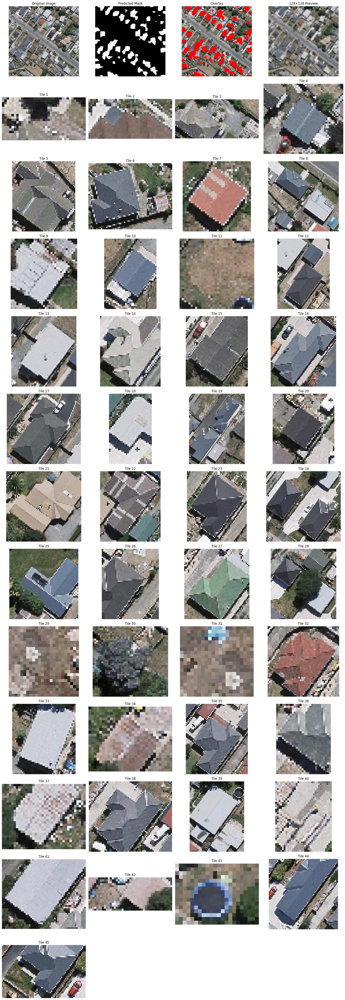

In [24]:
# ===========================================
# STEP 8 — VISUALIZE ROI TRANSMISSION PACKAGE
# ===========================================
import json
import random
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import math
import os

PKG_ROOT = "roi_transmission_packages"

# ---- FIX: Search inside subfolders for *_meta.json ----
json_files = []
for folder in os.listdir(PKG_ROOT):
    sub = os.path.join(PKG_ROOT, folder)
    if os.path.isdir(sub):
        for f in os.listdir(sub):
            if f.endswith("_meta.json"):
                json_files.append(os.path.join(sub, f))

if len(json_files) == 0:
    raise ValueError("❌ No ROI packages found. Run extraction first.")

# Pick a random metadata file
sample_meta = random.choice(json_files)
print("📦 Visualizing:", sample_meta)

# Load JSON
with open(sample_meta, "r") as f:
    meta = json.load(f)

package_dir = os.path.dirname(sample_meta)

# -----------------------------
# Load images
# -----------------------------

# Original full-res image
orig_img = Image.open(meta["image"])

# Predicted mask
mask_img = Image.open(os.path.join(package_dir, meta["mask_path"])).convert("L")

# Preview 128×128 image
preview_img = Image.open(os.path.join(package_dir, meta["preview_path"]))

# Create red overlay mask
overlay = orig_img.copy()
overlay_np = np.array(overlay)
mask_resized = mask_img.resize(orig_img.size)
mask_np = np.array(mask_resized) > 127
overlay_np[mask_np] = [255, 0, 0]  # red overlay
overlay = Image.fromarray(overlay_np)

# Load all ROI tiles
tile_images = []
for tile_path in meta["tiles"]:
    full_path = os.path.join(PKG_ROOT, tile_path)
    if os.path.exists(full_path):
        tile_images.append(Image.open(full_path))
    else:
        print("⚠️ Missing tile:", full_path)

# -----------------------------
# Visualization layout
# -----------------------------

rows = 2 + math.ceil(len(tile_images) / 4)
cols = 4

plt.figure(figsize=(18, 4 * rows))

# Original
plt.subplot(rows, cols, 1)
plt.imshow(orig_img)
plt.title("Original Image")
plt.axis("off")

# Mask
plt.subplot(rows, cols, 2)
plt.imshow(mask_img, cmap="gray")
plt.title("Predicted Mask")
plt.axis("off")

# Overlay
plt.subplot(rows, cols, 3)
plt.imshow(overlay)
plt.title("Overlay")
plt.axis("off")

# Preview
plt.subplot(rows, cols, 4)
plt.imshow(preview_img)
plt.title("128×128 Preview")
plt.axis("off")

# Tiles
for i, tile in enumerate(tile_images):
    plt.subplot(rows, cols, 5 + i)
    plt.imshow(tile)
    plt.title(f"Tile {i+1}")
    plt.axis("off")

plt.tight_layout()
plt.show()
